In [1]:
import datetime
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import folium
import os
from scipy.spatial import Voronoi
# for requirements: install fastparquet 

import glob # not needed in requirements

## 1. Random operations on data

### Raw data processing: removing null HO and grouping by eNB pairs

In [2]:
def get_filename(date, folder):
    dir = '..\\..\\HOCNAM_week\\HOCNAM\\' + folder + '\\' + date 
    filename = dir
    for root,dirs,files in os.walk(dir):
        for file in files:
            if file.endswith(".csv"):
                filename += '\\' + file
    return filename

In [9]:
DATE = '2024-10-28'
DATES = ['2024-10-28','2024-10-29','2024-10-30','2024-10-31','2024-11-01','2024-11-02','2024-11-03']

PATH_CELLS = get_filename(DATE, folder='cells')
PATH_HO = get_filename(DATE, folder='CSV_ho')
PATH_IMSI = get_filename(DATE, folder='CSV_nbimsi')

In [29]:
imsi_df = pd.read_csv(PATH_IMSI)
imsi_df

,eci_4g,ts_utc,nb_imsi,dthr_cest
0,24723972,1730138400,510,2024-10-28 19:00:00
1,24162316,1730131200,365,2024-10-28 17:00:00
2,24304130,1730131200,937,2024-10-28 17:00:00
3,24575498,1730134800,1168,2024-10-28 18:00:00
4,24720900,1730134800,1152,2024-10-28 18:00:00
...,...,...,...,...
814379,24639500,1730142000,2,2024-10-28 20:00:00
814380,24533768,1730077200,1,2024-10-28 02:00:00
814381,25567748,1730084400,1,2024-10-28 04:00:00
814382,25581314,1730073600,1,2024-10-28 01:00:00


In [59]:
d = datetime.datetime(2024, 10, 28, 19, 0, 0)
print(d)

import time
utsp = time.mktime(d.timetuple())
print(utsp)

2024-10-28 19:00:00
1730138400.0


In [14]:
total_users, total_ho = [], []

for d in DATES:
    path = get_filename(d, folder='CSV_ho')
    print('Opening', path)
    df = pd.read_csv(path)
    total_users.append(df.nb_imsi.sum())
    total_ho.append(df.nb_ho.sum())
    print('Number of users:', total_users[-1])
    print('Number of handovers:', total_ho[-1])

Opening ..\..\HOCNAM_week\HOCNAM\CSV_ho\2024-10-28\part-00000-5a076526-ede6-408a-a0d3-e3795bd6d677-c000.csv
Number of users: 448988231
Number of handovers: 1604624692
Opening ..\..\HOCNAM_week\HOCNAM\CSV_ho\2024-10-29\part-00000-4f72404a-a411-43a2-95c4-f4382bbd4088-c000.csv
Number of users: 469411852
Number of handovers: 1671130617
Opening ..\..\HOCNAM_week\HOCNAM\CSV_ho\2024-10-30\part-00000-026bbb85-19f2-4362-a0c4-b853ccfff205-c000.csv
Number of users: 467553718
Number of handovers: 1661058380
Opening ..\..\HOCNAM_week\HOCNAM\CSV_ho\2024-10-31\part-00000-658bd48a-1fcb-4384-8d8a-e51b4ac13f38-c000.csv
Number of users: 478411739
Number of handovers: 1664757941
Opening ..\..\HOCNAM_week\HOCNAM\CSV_ho\2024-11-01\part-00000-308d772d-fd8b-4776-b9f1-b9b50d8b4a9c-c000.csv
Number of users: 370147478
Number of handovers: 1345216141
Opening ..\..\HOCNAM_week\HOCNAM\CSV_ho\2024-11-02\part-00000-02ff6778-cb3b-44c6-bdd6-e33e50fd11d8-c000.csv
Number of users: 377797751
Number of handovers: 135855762

In [17]:
sum(total_users)

np.int64(2963331831)

In [10]:
ho_df = pd.read_csv(PATH_HO)
ho_df

,prev_eci_4g,eci_4g,ts_utc,nb_imsi,nb_ho,dthr_cest
0,24450049.0,26072590,1730134800,10,10,2024-10-28 18:00:00
1,24549398.0,23996936,1730138400,43,57,2024-10-28 19:00:00
2,25038593.0,25700869,1730138400,380,386,2024-10-28 19:00:00
3,25604877.0,25428998,1730134800,13,13,2024-10-28 18:00:00
4,24067336.0,24091144,1730131200,385,398,2024-10-28 17:00:00
...,...,...,...,...,...,...
17037367,25951756.0,24085766,1730142000,1,1,2024-10-28 20:00:00
17037368,24968968.0,24517641,1730142000,1,1,2024-10-28 20:00:00
17037369,24745729.0,24269320,1730091600,1,1,2024-10-28 06:00:00
17037370,24522755.0,25898498,1730127600,1,1,2024-10-28 16:00:00


In [90]:
df = pd.DataFrame(ho_df.groupby(['prev_eci_4g', 'eci_4g'])[['nb_imsi','nb_ho']].sum())
df

nb_imsi  nb_ho
prev_eci_4g eci_4g                   
11343873.0  265951235        1      1
14254856.0  24417801         0      0
14256897.0  24588042         1      1
14256900.0  24967169         0      0
14349825.0  24719874         1      1
...                        ...    ...
268145155.0 24739076         0      0
            24750594         0      0
            24755714         0      0
268145411.0 24739073         0      0
268146689.0 14643202         1      1

[2472087 rows x 2 columns]

In [27]:
ho_df.dtypes

prev_eci_4g    float64
eci_4g           int64
ts_utc           int64
nb_imsi          int64
nb_ho            int64
dthr_cest       object
dtype: object

In [4]:
cells_df = pd.read_csv(PATH_CELLS) 
cells_df

,eci_4g,nom_cellule,couverture,azimuth,longitude,latitude
0,24316425,MEAUX_BEAUVAL_ENB1_H2,OUTDOOR,110,2.920664,48.952232
1,24316419,MEAUX_BEAUVAL_ENB1_E3,OUTDOOR,240,2.920664,48.952232
2,24316429,MEAUX_BEAUVAL_ENB1_V3,OUTDOOR,240,2.920664,48.952232
3,24316417,MEAUX_BEAUVAL_ENB1_E1,OUTDOOR,0,2.920664,48.952232
4,24316428,MEAUX_BEAUVAL_ENB1_V2,OUTDOOR,110,2.920664,48.952232
...,...,...,...,...,...,...
41124,24886023,FONTENAILLES_ENB2_K1,OUTDOOR,100,2.953028,48.555122
41125,24886024,FONTENAILLES_ENB2_K2,OUTDOOR,220,2.953028,48.555122
41126,24886018,FONTENAILLES_ENB2_F2,OUTDOOR,220,2.953028,48.555122
41127,24886025,FONTENAILLES_ENB2_K3,OUTDOOR,340,2.953028,48.555122


In [10]:
cells_df.dtypes

eci_4g           int64
nom_cellule     object
couverture      object
azimuth          int64
longitude      float64
latitude       float64
dtype: object

In [ ]:
# TODO: rename cells and agregate antennas by new name (same location), use later instead of eci_4g
txt = 'MEAUX_BEAUVAL_ENB1_H2'
l = txt.split('_')
'_'.join(l[0:-2])

'MEAUX_BEAUVAL'

In [79]:
cells_list = []

for id, row in cells_df.iterrows():
    prev_name = row['nom_cellule'].split('_')
    cells_list.append('_'.join(prev_name[0:-2]))
    
cells_df['Cell'] = cells_list
cells_df

,eci_4g,nom_cellule,couverture,azimuth,longitude,latitude,Cell
0,24316425,MEAUX_BEAUVAL_ENB1_H2,OUTDOOR,110,2.920664,48.952232,MEAUX_BEAUVAL
1,24316419,MEAUX_BEAUVAL_ENB1_E3,OUTDOOR,240,2.920664,48.952232,MEAUX_BEAUVAL
2,24316429,MEAUX_BEAUVAL_ENB1_V3,OUTDOOR,240,2.920664,48.952232,MEAUX_BEAUVAL
3,24316417,MEAUX_BEAUVAL_ENB1_E1,OUTDOOR,0,2.920664,48.952232,MEAUX_BEAUVAL
4,24316428,MEAUX_BEAUVAL_ENB1_V2,OUTDOOR,110,2.920664,48.952232,MEAUX_BEAUVAL
...,...,...,...,...,...,...,...
41124,24886023,FONTENAILLES_ENB2_K1,OUTDOOR,100,2.953028,48.555122,FONTENAILLES
41125,24886024,FONTENAILLES_ENB2_K2,OUTDOOR,220,2.953028,48.555122,FONTENAILLES
41126,24886018,FONTENAILLES_ENB2_F2,OUTDOOR,220,2.953028,48.555122,FONTENAILLES
41127,24886025,FONTENAILLES_ENB2_K3,OUTDOOR,340,2.953028,48.555122,FONTENAILLES


In [66]:
ho_df = pd.read_parquet('..\\Processed_data\\4G_HOCNAM_week.snappy.parquet', engine='fastparquet') # Paris 2024
#ho_df = ho_df.loc[ho_df.prev_eci_4g != ho_df.eci_4g]
ho_df

,prev_eci_4g,eci_4g,nb_ho,srcCell,srcLON,srcLAT,dstCell,dstLON,dstLAT
index,,,,,,,,,
688,23980801,23980801,24,VILLEDO_ENB1_E1,2.337431,48.867230,VILLEDO_ENB1_E1,2.337431,48.867230
689,23980801,23983106,5,VILLEDO_ENB1_E1,2.337431,48.867230,BOULE_ROUGE_ENB1_E2,2.344583,48.872950
690,23980801,23983107,54,VILLEDO_ENB1_E1,2.337431,48.867230,BOULE_ROUGE_ENB1_E3,2.344583,48.872950
691,23980801,23983113,1,VILLEDO_ENB1_E1,2.337431,48.867230,BOULE_ROUGE_ENB1_H3,2.344583,48.872950
692,23980801,23983361,3,VILLEDO_ENB1_E1,2.337431,48.867230,TRINITE_BIS_ENB1_E1,2.335047,48.875404
...,...,...,...,...,...,...,...,...,...
3897636,26400778,26172943,1,RUE_BAGNOLET_BIS_ENB2_K2,2.399294,48.856537,PORTE_DE_MONTREUIL_ENB2_K3,2.417500,48.852920
3897637,26400778,26246150,3,RUE_BAGNOLET_BIS_ENB2_K2,2.399294,48.856537,MENILMONTANT_ENB2_F2,2.391297,48.866524
3897638,26400778,26246159,19,RUE_BAGNOLET_BIS_ENB2_K2,2.399294,48.856537,MENILMONTANT_ENB2_K2,2.391297,48.866524


In [70]:
pd.DataFrame(ho_df.groupby(['srcLON', 'srcLAT','dstLON','dstLAT'])['nb_ho'].sum())

nb_ho
srcLON   srcLAT    dstLON   dstLAT           
2.248553 48.893050 2.248553 48.893050   16956
                   2.248772 48.892000    3937
                   2.248822 48.878080     157
                   2.248922 48.884388    1851
                   2.249897 48.888058       1
...                                       ...
2.418389 48.812458 2.408133 48.856000       2
                   2.410700 48.823105  207345
                   2.413614 48.869164    3206
                   2.417019 48.843113       1
                   2.418389 48.812458  135174

[55503 rows x 1 columns]

In [4]:
PATH_HO = '..\\..\\Data_Handover\\usersHandovers\\2019\\03\\16\\Lyon_HO_IN'

all_files = glob.glob(PATH_HO + "\\*.parquet")

li = []

for filename in all_files:
    df = pd.read_parquet(filename, engine='fastparquet')
    li.append(df)

frame = pd.concat(li, axis=0, ignore_index=True)
frame

,timeSlot,srcLocInfo,dstLocInfo,nbHO15
0,1552734000,8102f81000009986,8102f81000009991,171
1,1552753800,8102f810000099d1,8102f810000099ae,1508
2,1552757400,8102f8100000a481,8102f81000009c31,814
3,1552753800,8102f81000009de8,8102f81000009d5e,277
4,1552732200,8102f81000009952,8102f81000009975,1198
...,...,...,...,...
719641,1552759200,0002f8100704edda,0002f8100704512d,0
719642,1552759200,0002f81051100807,0002f81051053587,0
719643,1552746600,8102f8100000ba74,8102f8100000ba60,0
719644,1552770000,8102f810000099c9,8102f8100000babc,0


In [5]:
agg = frame.groupby('timeSlot')['nbHO15'].sum()
time_df = pd.DataFrame(agg)
time_df.head()

,nbHO15
timeSlot,
1552690800,321050
1552692600,238867
1552694400,202796
1552696200,146731
1552698000,125253


In [7]:
d = datetime.datetime(2019, 3, 16, 1, 0, 0)
print(d)

import time
utsp = time.mktime(d.timetuple())
print(utsp)

2019-03-16 01:00:00
1552694400.0


In [6]:
ser = pd.Series()
for idx,row in time_df.iterrows():
    ser[idx] = datetime.datetime.fromtimestamp(row.name)
time_df['Time'] = ser
time_df

,nbHO15,Time
timeSlot,,
1552690800,321050,2019-03-16 00:00:00
1552692600,238867,2019-03-16 00:30:00
1552694400,202796,2019-03-16 01:00:00
1552696200,146731,2019-03-16 01:30:00
1552698000,125253,2019-03-16 02:00:00
1552699800,113050,2019-03-16 02:30:00
1552701600,106047,2019-03-16 03:00:00
1552703400,106442,2019-03-16 03:30:00
1552705200,105907,2019-03-16 04:00:00


In [7]:
agg = frame.groupby(['srcLocInfo', 'dstLocInfo'])['nbHO15'].sum()
df_agg = pd.DataFrame(agg)
df_agg = df_agg[df_agg['nbHO15'] >0] 
#agg = agg.drop(agg.loc[agg.values==0].index)
#agg
df_agg

nbHO15
srcLocInfo       dstLocInfo              
0002f81000686160 0002f81007013bfa      26
0002f810041c2388 0002f81007041283      16
0002f81007011463 0002f8100701fe3f      31
0002f81007011465 0002f810070126d7      17
0002f810070114de 0002f81007013336    1240
...                                   ...
8102f8100000bad0 8102f8100000a1fa     515
                 8102f8100000a4d9      57
                 8102f8100000b9cc    5924
                 8102f8100000ba30     189
                 8102f8100000babe     184

[11700 rows x 1 columns]

## Processing aggregated data

In [5]:
#PATH_HO = '..\\Processed_data\\4G_CSV_ho_AGG_week.snappy.parquet'
PATH_HO = '..\\Processed_data\\4G_CSV_ho_AGG_2024-10-28.snappy.parquet'
PATH_CELLS = '..\\Processed_data\\4G_cells_AGG_week.snappy.parquet'

In [125]:
ho_df = pd.read_parquet(path=PATH_HO, engine='fastparquet')
ho_df

,prev_eci_4g,eci_4g,nb_imsi,nb_ho
0,11343873,265951235,1,1
1,14256897,24588042,1,1
2,14349825,24719874,1,1
3,14349825,25514757,2,2
4,14352645,24478727,1,1
...,...,...,...,...
2409257,267841030,267745545,15,15
2409258,267841030,267841028,7,7
2409259,267841030,267841029,9,9
2409260,267841030,267841030,171,182


In [6]:
cells_df = pd.read_parquet(path=PATH_CELLS, engine='fastparquet')
cells_df

,eci_4g,nom_cellule,couverture,azimuth,longitude,latitude,Cell
0,24316425,MEAUX_BEAUVAL_ENB1_H2,OUTDOOR,110,2.920664,48.952232,MEAUX_BEAUVAL
1,24316419,MEAUX_BEAUVAL_ENB1_E3,OUTDOOR,240,2.920664,48.952232,MEAUX_BEAUVAL
2,24316429,MEAUX_BEAUVAL_ENB1_V3,OUTDOOR,240,2.920664,48.952232,MEAUX_BEAUVAL
3,24316417,MEAUX_BEAUVAL_ENB1_E1,OUTDOOR,0,2.920664,48.952232,MEAUX_BEAUVAL
4,24316428,MEAUX_BEAUVAL_ENB1_V2,OUTDOOR,110,2.920664,48.952232,MEAUX_BEAUVAL
...,...,...,...,...,...,...,...
41289,24527366,ROISSY_T1_ENB1_H2,INDOOR,40,2.541550,49.014233,ROISSY_T1
41290,24527371,ROISSY_T1_ENB1_V3,INDOOR,80,2.541550,49.014233,ROISSY_T1
41291,24527369,ROISSY_T1_ENB1_E2,INDOOR,40,2.541550,49.014233,ROISSY_T1
41292,24527365,ROISSY_T1_ENB1_H3,INDOOR,80,2.541550,49.014233,ROISSY_T1


In [8]:
len(cells_df.Cell.unique())

4073

In [84]:
cells_df.loc[cells_df.Cell=='MEAUX_BEAUVAL']

,eci_4g,nom_cellule,couverture,azimuth,longitude,latitude,Cell
0,24316425,MEAUX_BEAUVAL_ENB1_H2,OUTDOOR,110,2.920664,48.952232,MEAUX_BEAUVAL
1,24316419,MEAUX_BEAUVAL_ENB1_E3,OUTDOOR,240,2.920664,48.952232,MEAUX_BEAUVAL
2,24316429,MEAUX_BEAUVAL_ENB1_V3,OUTDOOR,240,2.920664,48.952232,MEAUX_BEAUVAL
3,24316417,MEAUX_BEAUVAL_ENB1_E1,OUTDOOR,0,2.920664,48.952232,MEAUX_BEAUVAL
4,24316428,MEAUX_BEAUVAL_ENB1_V2,OUTDOOR,110,2.920664,48.952232,MEAUX_BEAUVAL
5,24316426,MEAUX_BEAUVAL_ENB1_H3,OUTDOOR,240,2.920664,48.952232,MEAUX_BEAUVAL
6,24316424,MEAUX_BEAUVAL_ENB1_H1,OUTDOOR,0,2.920664,48.952232,MEAUX_BEAUVAL
7,24316427,MEAUX_BEAUVAL_ENB1_V1,OUTDOOR,0,2.920664,48.952232,MEAUX_BEAUVAL
8,24316418,MEAUX_BEAUVAL_ENB1_E2,OUTDOOR,110,2.920664,48.952232,MEAUX_BEAUVAL
33374,24316422,MEAUX_BEAUVAL_ENB2_F2,OUTDOOR,110,2.920664,48.952232,MEAUX_BEAUVAL


In [127]:
ho_df = ho_df.join(cells_df[['eci_4g','Cell']].set_index('eci_4g'), on='prev_eci_4g')
ho_df.rename(columns={'Cell':'srcCell'}, inplace=True)
ho_df = ho_df.dropna(ignore_index=True)

ho_df = ho_df.join(cells_df[['eci_4g','Cell']].set_index('eci_4g'), on='eci_4g')
ho_df.rename(columns={'Cell':'dstCell'}, inplace=True)
ho_df = ho_df.dropna(ignore_index=True)

ho_df

,prev_eci_4g,eci_4g,nb_imsi,nb_ho,srcCell,dstCell
0,14643201,14643201,711,713,AUNAY_TGV_BIS,AUNAY_TGV_BIS
1,14643201,14643202,902,903,AUNAY_TGV_BIS,AUNAY_TGV_BIS
2,14643201,14643204,147,147,AUNAY_TGV_BIS,AUNAY_TGV_BIS
3,14643201,14643205,136,136,AUNAY_TGV_BIS,AUNAY_TGV_BIS
4,14643201,14643207,93,93,AUNAY_TGV_BIS,AUNAY_TGV_BIS
...,...,...,...,...,...,...
2389099,267841030,267745544,7,7,ND_RS_LECHELLE_ORF,ND_RS_LECHELLE_ORF
2389100,267841030,267745545,15,15,ND_RS_LECHELLE_ORF,ND_RS_LECHELLE_ORF
2389101,267841030,267841028,7,7,ND_RS_LECHELLE_ORF,ND_RS_LECHELLE_ORF
2389102,267841030,267841029,9,9,ND_RS_LECHELLE_ORF,ND_RS_LECHELLE_ORF


In [128]:
# Group by cell name (antennas located at the same point)
ho_df = ho_df.groupby(['srcCell','dstCell'])[['nb_imsi','nb_ho']].sum()
ho_df = ho_df.reset_index()
ho_df 

,srcCell,dstCell,nb_imsi,nb_ho
0,A12_TRIANGLE_DE_ROCQUENCOURT,A12_TRIANGLE_DE_ROCQUENCOURT,23,23
1,A12_TRIANGLE_DE_ROCQUENCOURT,BEYNES_BIS,1,1
2,A12_TRIANGLE_DE_ROCQUENCOURT,BEYNES_D119,1,1
3,A12_TRIANGLE_DE_ROCQUENCOURT,BEYNES_TDB,1,1
4,A12_TRIANGLE_DE_ROCQUENCOURT,BOIS_D_ARCY_CROIX_BLANCHE,17,17
...,...,...,...,...
184932,ZENITH_INDOOR,PORTE_DES_LILAS,1,1
184933,ZENITH_INDOOR,QUATRE_CHEMINS,2,2
184934,ZENITH_INDOOR,RUE_DE_TOULOUSE,8,12
184935,ZENITH_INDOOR,STADE_LADOUMEGUE,13,21


In [129]:
agg_cells_df = cells_df.groupby('Cell', group_keys=True)[['longitude','latitude']].mean()
agg_cells_df = agg_cells_df.reset_index()
agg_cells_df

,Cell,longitude,latitude
0,A12_TRIANGLE_DE_ROCQUENCOURT,2.093986,48.842075
1,ABBESSES_METRO_L12,2.338358,48.884530
2,ABBESSES_MICRO,2.338767,48.883987
3,ABBEVILLE_LA_RIVIERE,2.193303,48.356170
4,ABBE_ROUSSELOT,2.302803,48.888523
...,...,...,...
4068,YERRES_BOUT_DU_MONDE,2.510731,48.709293
4069,YERRES_LES_GRANDS_GODEAUX,2.500569,48.716667
4070,YERRES_LE_TAILLIS,2.480614,48.696434
4071,ZAC_DES_LILAS,2.408325,48.877020


### Joining src and dst coordinates

In [130]:
# Add src EnB coordinates
ho_df = ho_df.join(agg_cells_df[['Cell','longitude','latitude']].set_index('Cell'), on='srcCell')
ho_df.rename(columns={'Cell':'srcCell','longitude':'srcLON', 'latitude':'srcLAT'}, inplace=True)
ho_df = ho_df.dropna(ignore_index=True)

# Add dst EnB coordinates
ho_df = ho_df.join(agg_cells_df[['Cell','longitude','latitude']].set_index('Cell'), on='dstCell')
ho_df.rename(columns={'Cell':'dstCell','longitude':'dstLON', 'latitude':'dstLAT'}, inplace=True)
ho_df = ho_df.dropna(ignore_index=True)
ho_df

,srcCell,dstCell,nb_imsi,nb_ho,srcLON,srcLAT,dstLON,dstLAT
0,A12_TRIANGLE_DE_ROCQUENCOURT,A12_TRIANGLE_DE_ROCQUENCOURT,23,23,2.093986,48.842075,2.093986,48.842075
1,A12_TRIANGLE_DE_ROCQUENCOURT,BEYNES_BIS,1,1,2.093986,48.842075,1.872747,48.845040
2,A12_TRIANGLE_DE_ROCQUENCOURT,BEYNES_D119,1,1,2.093986,48.842075,1.857706,48.859165
3,A12_TRIANGLE_DE_ROCQUENCOURT,BEYNES_TDB,1,1,2.093986,48.842075,1.900411,48.837810
4,A12_TRIANGLE_DE_ROCQUENCOURT,BOIS_D_ARCY_CROIX_BLANCHE,17,17,2.093986,48.842075,2.010703,48.797540
...,...,...,...,...,...,...,...,...
184932,ZENITH_INDOOR,PORTE_DES_LILAS,1,1,2.393206,48.894215,2.400011,48.885555
184933,ZENITH_INDOOR,QUATRE_CHEMINS,2,2,2.393206,48.894215,2.394108,48.909058
184934,ZENITH_INDOOR,RUE_DE_TOULOUSE,8,12,2.393206,48.894215,2.393536,48.883896
184935,ZENITH_INDOOR,STADE_LADOUMEGUE,13,21,2.393206,48.894215,2.393008,48.888416


In [131]:
ho_df.to_parquet('..\\Processed_data\\4G_CSV_ho_AGG_2024-10-28_coords.snappy.parquet', engine='fastparquet', compression='snappy')

In [120]:
ho_df.dtypes

srcCell     object
dstCell     object
nb_imsi      int64
nb_ho        int64
srcLON     float64
srcLAT     float64
dstLON     float64
dstLAT     float64
dtype: object

### Reducing to geographic zone of interest

In [132]:
lon1, lat1 = 2.248553, 48.89305
lon2, lat2 = 2.418389, 48.812458

In [133]:
# Reduce by source and dst coords
ho_df = ho_df.loc[(ho_df['srcLON'] >= lon1) & (ho_df['srcLON'] <= lon2) & (ho_df['srcLAT'] >= lat2) & (ho_df['srcLAT'] <= lat1)]
ho_df = ho_df.loc[(ho_df['dstLON'] >= lon1) & (ho_df['dstLON'] <= lon2) & (ho_df['dstLAT'] >= lat2) & (ho_df['dstLAT'] <= lat1)]
ho_df

,srcCell,dstCell,nb_imsi,nb_ho,srcLON,srcLAT,dstLON,dstLAT
65,ABBESSES_METRO_L12,ABBESSES_MICRO,688,695,2.338358,48.884530,2.338767,48.883987
67,ABBESSES_METRO_L12,JULES_JOFFRIN_METRO_L12,11,12,2.338358,48.884530,2.344628,48.892544
68,ABBESSES_METRO_L12,LAMARCK_CAULAINCOURT_METRO_L12,3414,3414,2.338358,48.884530,2.338700,48.889874
69,ABBESSES_METRO_L12,ST_GEORGES_METRO_L12,15,23,2.338358,48.884530,2.337717,48.878418
70,ABBESSES_MICRO,ABBESSES_METRO_L12,446,449,2.338767,48.883987,2.338358,48.884530
...,...,...,...,...,...,...,...,...
184919,ZAC_DES_LILAS,ST_FARGEAU_IDF,1320,1394,2.408325,48.877020,2.408414,48.871387
184920,ZAC_DES_LILAS,TELEGRAPHE,31,47,2.408325,48.877020,2.397586,48.875732
184921,ZAC_DES_LILAS,TPIM_PTE_DES_LILAS,14063,14439,2.408325,48.877020,2.408450,48.878270
184922,ZAC_DES_LILAS,TPIM_SQUARE_FLEURY_FOUGERES_BIS,2526,2533,2.408325,48.877020,2.412189,48.873013


In [134]:
ho_df.to_parquet('..\\Processed_data\\4G_CSV_ho_AGG_2024-10-28_coords_Paris.snappy.parquet', engine='fastparquet', compression='snappy')

In [135]:
ho_df = pd.read_parquet('..\\Processed_data\\4G_CSV_ho_AGG_2024-10-28_coords.snappy.parquet', engine='fastparquet')
ho_df

,srcCell,dstCell,nb_imsi,nb_ho,srcLON,srcLAT,dstLON,dstLAT
0,A12_TRIANGLE_DE_ROCQUENCOURT,A12_TRIANGLE_DE_ROCQUENCOURT,23,23,2.093986,48.842075,2.093986,48.842075
1,A12_TRIANGLE_DE_ROCQUENCOURT,BEYNES_BIS,1,1,2.093986,48.842075,1.872747,48.845040
2,A12_TRIANGLE_DE_ROCQUENCOURT,BEYNES_D119,1,1,2.093986,48.842075,1.857706,48.859165
3,A12_TRIANGLE_DE_ROCQUENCOURT,BEYNES_TDB,1,1,2.093986,48.842075,1.900411,48.837810
4,A12_TRIANGLE_DE_ROCQUENCOURT,BOIS_D_ARCY_CROIX_BLANCHE,17,17,2.093986,48.842075,2.010703,48.797540
...,...,...,...,...,...,...,...,...
184932,ZENITH_INDOOR,PORTE_DES_LILAS,1,1,2.393206,48.894215,2.400011,48.885555
184933,ZENITH_INDOOR,QUATRE_CHEMINS,2,2,2.393206,48.894215,2.394108,48.909058
184934,ZENITH_INDOOR,RUE_DE_TOULOUSE,8,12,2.393206,48.894215,2.393536,48.883896
184935,ZENITH_INDOOR,STADE_LADOUMEGUE,13,21,2.393206,48.894215,2.393008,48.888416


In [63]:
def create_map():
    map = folium.Map([48.854816, 2.347061], tiles="OpenStreetMap", zoom_start=13)
    print('Creating base station map...')
    return map

def add_stations(map, df, type='ho', name='4G stations'):
    print('Adding '+name+' layer')
    fg = folium.FeatureGroup(name=name) # Name as it will appear in Layer control
    if type=='ho':
        enb_ids = df.srcCell.unique()
        for id in enb_ids:
            enb_data = df.loc[df['srcCell']==id]
            fg.add_child(folium.CircleMarker(
                location=[enb_data['srcLAT'].iloc[-1], enb_data['srcLON'].iloc[-1]],
                tooltip=enb_data['srcCell'].iloc[-1],
                color='black',
                weight=1,
                fill=True,
                fill_color='blue',
                fill_opacity=0.9,
                radius=2
            ))
    if type=='cell':
        enb_ids = df.Cell.tolist()
        for id in enb_ids:
            enb_data = df.loc[df['Cell']==id]
            fg.add_child(folium.Marker(
                location=[enb_data['LAT'].iloc[-1], enb_data['LON'].iloc[-1]],
                popup=enb_data['Cell'].iloc[-1],
                tooltip=enb_data['traffic_part'].iloc[-1]
            ))
    map.add_child(fg)
    
    
def close_map(map, filename):
    folium.LayerControl().add_to(map)
    map.save('maps\\'+filename)
    print('Closing', filename, 'map.')

In [139]:
hocnam = create_map()
folium.TileLayer('CartoDB Positron').add_to(hocnam)
add_stations(hocnam, ho_df)
hocnam

Creating base station map...
Adding 4G stations layer


In [140]:
close_map(hocnam, 'HOCNAM_stations_IDF.html')

Closing HOCNAM_stations_IDF.html map.


## Traffic visualization

### Temporal analysis: IMSI

In [7]:
DATE = '2024-10-28'
PATH_IMSI = get_filename(DATE, folder='CSV_nbimsi')
PATH_CELLS = '..\\Processed_data\\4G_cells_AGG_week.snappy.parquet'

In [71]:
imsi_df = pd.read_csv(PATH_IMSI)
imsi_df

,eci_4g,ts_utc,nb_imsi,dthr_cest
0,24723972,1730138400,510,2024-10-28 19:00:00
1,24162316,1730131200,365,2024-10-28 17:00:00
2,24304130,1730131200,937,2024-10-28 17:00:00
3,24575498,1730134800,1168,2024-10-28 18:00:00
4,24720900,1730134800,1152,2024-10-28 18:00:00
...,...,...,...,...
814379,24639500,1730142000,2,2024-10-28 20:00:00
814380,24533768,1730077200,1,2024-10-28 02:00:00
814381,25567748,1730084400,1,2024-10-28 04:00:00
814382,25581314,1730073600,1,2024-10-28 01:00:00


In [69]:
cells_df = pd.read_parquet(PATH_CELLS, engine='fastparquet') 
cells_df

,eci_4g,nom_cellule,couverture,azimuth,longitude,latitude,Cell
0,24316425,MEAUX_BEAUVAL_ENB1_H2,OUTDOOR,110,2.920664,48.952232,MEAUX_BEAUVAL
1,24316419,MEAUX_BEAUVAL_ENB1_E3,OUTDOOR,240,2.920664,48.952232,MEAUX_BEAUVAL
2,24316429,MEAUX_BEAUVAL_ENB1_V3,OUTDOOR,240,2.920664,48.952232,MEAUX_BEAUVAL
3,24316417,MEAUX_BEAUVAL_ENB1_E1,OUTDOOR,0,2.920664,48.952232,MEAUX_BEAUVAL
4,24316428,MEAUX_BEAUVAL_ENB1_V2,OUTDOOR,110,2.920664,48.952232,MEAUX_BEAUVAL
...,...,...,...,...,...,...,...
41289,24527366,ROISSY_T1_ENB1_H2,INDOOR,40,2.541550,49.014233,ROISSY_T1
41290,24527371,ROISSY_T1_ENB1_V3,INDOOR,80,2.541550,49.014233,ROISSY_T1
41291,24527369,ROISSY_T1_ENB1_E2,INDOOR,40,2.541550,49.014233,ROISSY_T1
41292,24527365,ROISSY_T1_ENB1_H3,INDOOR,80,2.541550,49.014233,ROISSY_T1


In [72]:
imsi_df.dthr_cest = pd.to_datetime(imsi_df.dthr_cest, format="%Y-%m-%d %H:%M:%S")
imsi_df = imsi_df.join(cells_df[['eci_4g','Cell']].set_index('eci_4g'), on='eci_4g')
#imsi_df.rename(columns={'longitude':'LON', 'latitude':'LAT'}, inplace=True)
imsi_df = imsi_df.dropna(ignore_index=True)
imsi_df = imsi_df.sort_values(by=['dthr_cest', 'Cell'])
imsi_df

,eci_4g,ts_utc,nb_imsi,dthr_cest,Cell
47192,24473353,1730070000,116,2024-10-28 00:00:00,A12_TRIANGLE_DE_ROCQUENCOURT
77040,24473351,1730070000,22,2024-10-28 00:00:00,A12_TRIANGLE_DE_ROCQUENCOURT
108514,24473356,1730070000,69,2024-10-28 00:00:00,A12_TRIANGLE_DE_ROCQUENCOURT
117421,24473350,1730070000,99,2024-10-28 00:00:00,A12_TRIANGLE_DE_ROCQUENCOURT
124749,24473352,1730070000,422,2024-10-28 00:00:00,A12_TRIANGLE_DE_ROCQUENCOURT
...,...,...,...,...,...
551455,24652805,1730152800,494,2024-10-28 23:00:00,ZAC_DES_LILAS
268577,25243396,1730152800,2,2024-10-28 23:00:00,ZENITH_INDOOR
317713,25243397,1730152800,1,2024-10-28 23:00:00,ZENITH_INDOOR
546031,25243399,1730152800,1,2024-10-28 23:00:00,ZENITH_INDOOR


In [73]:
imsi_df = imsi_df.groupby(['dthr_cest','Cell'])['nb_imsi'].sum()
imsi_df = imsi_df.reset_index()
imsi_df 

,dthr_cest,Cell,nb_imsi
0,2024-10-28 00:00:00,A12_TRIANGLE_DE_ROCQUENCOURT,2574
1,2024-10-28 00:00:00,ABBESSES_METRO_L12,132
2,2024-10-28 00:00:00,ABBESSES_MICRO,198
3,2024-10-28 00:00:00,ABBEVILLE_LA_RIVIERE,221
4,2024-10-28 00:00:00,ABBE_ROUSSELOT,3988
...,...,...,...
91768,2024-10-28 23:00:00,YERRES_BOUT_DU_MONDE,1805
91769,2024-10-28 23:00:00,YERRES_LES_GRANDS_GODEAUX,1591
91770,2024-10-28 23:00:00,YERRES_LE_TAILLIS,2165
91771,2024-10-28 23:00:00,ZAC_DES_LILAS,4096


In [ ]:
imsi_df = imsi_df.join(cells_df[['Cell','longitude','latitude']].set_index('Cell'), on='Cell')
imsi_df.rename(columns={'longitude':'LON', 'latitude':'LAT'}, inplace=True)
imsi_df.drop_duplicates(inplace=True)
imsi_df

,dthr_cest,Cell,nb_imsi,LON,LAT
0,2024-10-28 00:00:00,A12_TRIANGLE_DE_ROCQUENCOURT,2574,2.093986,48.842075
1,2024-10-28 00:00:00,ABBESSES_METRO_L12,132,2.338358,48.884530
2,2024-10-28 00:00:00,ABBESSES_MICRO,198,2.338767,48.883987
3,2024-10-28 00:00:00,ABBEVILLE_LA_RIVIERE,221,2.193303,48.356170
4,2024-10-28 00:00:00,ABBE_ROUSSELOT,3988,2.302803,48.888523
...,...,...,...,...,...
91768,2024-10-28 23:00:00,YERRES_BOUT_DU_MONDE,1805,2.510731,48.709293
91769,2024-10-28 23:00:00,YERRES_LES_GRANDS_GODEAUX,1591,2.500569,48.716667
91770,2024-10-28 23:00:00,YERRES_LE_TAILLIS,2165,2.480614,48.696434
91771,2024-10-28 23:00:00,ZAC_DES_LILAS,4096,2.408325,48.877020


In [76]:
smin, smed, smax = int(imsi_df.nb_imsi.min()), int(imsi_df.nb_imsi.median()), int(imsi_df.nb_imsi.max())

imsi_df['traffic_part'] = (imsi_df.nb_imsi - smin)/(smax-smin)
imsi_df

,dthr_cest,Cell,nb_imsi,LON,LAT,traffic_part
0,2024-10-28 00:00:00,A12_TRIANGLE_DE_ROCQUENCOURT,2574,2.093986,48.842075,0.050576
1,2024-10-28 00:00:00,ABBESSES_METRO_L12,132,2.338358,48.884530,0.002594
2,2024-10-28 00:00:00,ABBESSES_MICRO,198,2.338767,48.883987,0.003890
3,2024-10-28 00:00:00,ABBEVILLE_LA_RIVIERE,221,2.193303,48.356170,0.004342
4,2024-10-28 00:00:00,ABBE_ROUSSELOT,3988,2.302803,48.888523,0.078359
...,...,...,...,...,...,...
91768,2024-10-28 23:00:00,YERRES_BOUT_DU_MONDE,1805,2.510731,48.709293,0.035466
91769,2024-10-28 23:00:00,YERRES_LES_GRANDS_GODEAUX,1591,2.500569,48.716667,0.031261
91770,2024-10-28 23:00:00,YERRES_LE_TAILLIS,2165,2.480614,48.696434,0.042539
91771,2024-10-28 23:00:00,ZAC_DES_LILAS,4096,2.408325,48.877020,0.080481


In [94]:
smean = int(imsi_df.nb_imsi.mean())
smean

3937

In [77]:
imsi_df.to_parquet('..\\Processed_data\\4G_CSV_nbimsi_2024-10-28_coords_IDF.snappy.parquet', engine='fastparquet', compression='snappy')

imsi_df = pd.read_parquet('..\\Processed_data\\4G_CSV_nbimsi_2024-10-28_coords_IDF.snappy.parquet', engine='fastparquet')
imsi_df

,dthr_cest,Cell,nb_imsi,LON,LAT,traffic_part
index,,,,,,
0,2024-10-28 00:00:00,A12_TRIANGLE_DE_ROCQUENCOURT,2574,2.093986,48.842075,0.050576
1,2024-10-28 00:00:00,ABBESSES_METRO_L12,132,2.338358,48.884530,0.002594
2,2024-10-28 00:00:00,ABBESSES_MICRO,198,2.338767,48.883987,0.003890
3,2024-10-28 00:00:00,ABBEVILLE_LA_RIVIERE,221,2.193303,48.356170,0.004342
4,2024-10-28 00:00:00,ABBE_ROUSSELOT,3988,2.302803,48.888523,0.078359
...,...,...,...,...,...,...
91768,2024-10-28 23:00:00,YERRES_BOUT_DU_MONDE,1805,2.510731,48.709293,0.035466
91769,2024-10-28 23:00:00,YERRES_LES_GRANDS_GODEAUX,1591,2.500569,48.716667,0.031261
91770,2024-10-28 23:00:00,YERRES_LE_TAILLIS,2165,2.480614,48.696434,0.042539


In [16]:
import branca
import branca.colormap as cm
from folium.plugins import HeatMap, HeatMapWithTime
from tqdm import tqdm

In [97]:
def add_voronoi(map, points, colormap, name='Voronoi cells'):
    print('Adding Voronoi layer')
    vor = Voronoi(list(zip(points['LAT'].tolist(), points['LON'].tolist())))  # Careful with the inversion!!  
    fg = folium.FeatureGroup(name=name, show=True)
    for enb, reg_idx in enumerate(vor.point_region):
        region = vor.regions[reg_idx]
        cell_locinfo = points.Cell.iloc[enb]
        if -1 not in region and region != []:
            region_coords = []
            for vertex in region:
                region_coords.append(vor.vertices[vertex])
            score = points.loc[points.Cell==cell_locinfo, 'nb_imsi'].iloc[0]
            fg.add_child(folium.Polygon(
                region_coords,
                color=None,
                weight=1,
                fill_color=colormap(score),
                fill_opacity=0.3,
                fill=True,
                tooltip=score
            ))
    map.add_child(fg)
    map.add_child(colormap)

In [17]:
time = datetime.datetime(2024, 10, 28, 0, 0, 0)
df = imsi_df.loc[imsi_df.dthr_cest==time]
df

,eci_4g,ts_utc,nb_imsi,dthr_cest,Cell,LON,LAT,traffic_part
index,,,,,,,,
296562,24584977,1730070000,18,2024-10-28,BURES_FAC_DE_SCIENCES,2.172269,48.703970,0.002116
267949,24827137,1730070000,44,2024-10-28,LA_PLANCHETTE,3.052317,48.777412,0.005172
267948,25866241,1730070000,192,2024-10-28,CELY,2.541767,48.467780,0.022567
267947,25165328,1730070000,9,2024-10-28,BTSH_MURAT_08_IND,2.256583,48.846897,0.001058
267946,25660417,1730070000,203,2024-10-28,PONT_DE_CHATOU_TER,2.169675,48.889507,0.023860
...,...,...,...,...,...,...,...,...
381279,24148737,1730070000,107,2024-10-28,COURBEVOIE_D908,2.255806,48.901333,0.012576
806506,24448013,1730070000,2,2024-10-28,SAVIGNY_SR_ORGE_D177,2.363244,48.673508,0.000235
380911,24574469,1730070000,59,2024-10-28,RIS_ORANGIS_MARCHE,2.404489,48.660492,0.006935


In [158]:
# Reduce by source and dst coords
df = df.loc[(df['LON'] >= lon1) & (df['LON'] <= lon2) & (df['LAT'] >= lat2) & (df['LAT'] <= lat1)]
df

,eci_4g,ts_utc,nb_imsi,dthr_cest,Cell,LON,LAT
797420,24341773,1730091600,108,2024-10-28 06:00:00,PONT_DE_PUTEAUX,2.248822,48.878080
422873,24526085,1730091600,29,2024-10-28 06:00:00,PALAIS_DES_CONGRES_INDOOR_IDF,2.283678,48.879234
316913,24001034,1730091600,214,2024-10-28 06:00:00,LE_PONANT,2.271206,48.839340
17357,25315847,1730091600,1264,2024-10-28 06:00:00,GARE_MONTPARNASSE_INDOOR_BIS,2.315225,48.838240
139990,25057538,1730091600,676,2024-10-28 06:00:00,TPEM_PONT_DE_NEUILLY_CDG,2.258608,48.885310
...,...,...,...,...,...,...,...
373902,24243976,1730091600,224,2024-10-28 06:00:00,RUE_SAUSSURE,2.312575,48.883564
222689,24011530,1730091600,133,2024-10-28 06:00:00,BASSANO,2.296917,48.868470
227819,24333579,1730091600,11,2024-10-28 06:00:00,OSM_CREDIT_AGRICOLE_MONTROUGE_INDOOR,2.312525,48.817670
48484,24371207,1730091600,105,2024-10-28 06:00:00,PORT_ROYAL_RER_B,2.337008,48.839832


In [79]:
tsp = set(imsi_df.dthr_cest)
data = [list(imsi_df.loc[imsi_df.dthr_cest==t][['LAT','LON','traffic_part']].values.tolist()) for t in tsp]
data

[[[48.842075, 2.093986, 0.03890438951546351],
  [48.88453, 2.338358, 0.00015718945258773136],
  [48.883987, 2.338767, 0.0019452194757731756],
  [48.35617, 2.193303, 0.0030258969623138286],
  [48.888523, 2.302803, 0.034326246708845834],
  [49.076595, 1.968969, 0.00449954808032381],
  [48.519386, 1.833789, 0.03809879357095139],
  [48.727543, 2.427331, 0.03096632215978308],
  [48.877724, 2.293108, 0.002750815420285299],
  [48.981224, 2.0786, 0.052619169253743076],
  [48.363068, 2.575181, 0.012260777301843046],
  [48.964718, 2.061553, 0.033776083624788775],
  [48.95932, 2.136572, 0.006798443824419381],
  [48.71394, 1.650367, 0.013518292922544898],
  [48.832073, 3.011481, 0.0029276535544464966],
  [49.00749, 2.537986, 0.02059181828899281],
  [48.83655, 2.24165, 0.0021810036546547726],
  [48.881466, 2.276683, 0.00033402758674892915],
  [48.85804, 2.280975, 0.0010217314418202539],
  [48.84634, 2.326019, 9.82434078673321e-05],
  [48.82902, 1.961075, 9.82434078673321e-05],
  [48.55971, 3.298058

In [101]:
d = datetime.datetime(2024, 10, 28, 2, 0, 0)
str(d)

'2024-10-28 02:00:00'

In [ ]:
time = datetime.datetime(2024, 10, 28, 20, 0, 0)
df = imsi_df.loc[imsi_df.dthr_cest==time]

#hocnam = create_map()
#folium.TileLayer('CartoDB Positron').add_to(hocnam)
colormap = cm.LinearColormap(colors=['blue','yellow','red'], index=[smin,smean,smax],vmin=smin,vmax=smax)
add_voronoi(hocnam, df, colormap, name=str(time))
#hocnam
#

Adding Voronoi layer


In [106]:
close_map(hocnam, 'HOCNAM_IMSI_IDF_voronoi_time.html')

Closing HOCNAM_IMSI_IDF_voronoi_time.html map.


In [80]:
hocnam = create_map()
folium.TileLayer('CartoDB Positron').add_to(hocnam)

HeatMapWithTime(
    data = data, 
    #index = tsp, 
    radius=10).add_to(hocnam)

#close_map(hocnam, 'HOCNAM_IMSI_IDF_timelapse.html')
hocnam

Creating base station map...


In [81]:
imsi_df.loc[imsi_df.Cell=='MAIRIE_D_ISSY_METRO_L12']

,dthr_cest,Cell,nb_imsi,LON,LAT,traffic_part
index,,,,,,
1804,2024-10-28 00:00:00,MAIRIE_D_ISSY_METRO_L12,39,2.273211,48.82427,0.000766
5618,2024-10-28 01:00:00,MAIRIE_D_ISSY_METRO_L12,7,2.273211,48.82427,0.000138
13216,2024-10-28 03:00:00,MAIRIE_D_ISSY_METRO_L12,0,2.273211,48.82427,0.000000
17007,2024-10-28 04:00:00,MAIRIE_D_ISSY_METRO_L12,1,2.273211,48.82427,0.000020
20809,2024-10-28 05:00:00,MAIRIE_D_ISSY_METRO_L12,23,2.273211,48.82427,0.000452
24623,2024-10-28 06:00:00,MAIRIE_D_ISSY_METRO_L12,107,2.273211,48.82427,0.002102
28447,2024-10-28 07:00:00,MAIRIE_D_ISSY_METRO_L12,330,2.273211,48.82427,0.006484
32282,2024-10-28 08:00:00,MAIRIE_D_ISSY_METRO_L12,1006,2.273211,48.82427,0.019767
36113,2024-10-28 09:00:00,MAIRIE_D_ISSY_METRO_L12,649,2.273211,48.82427,0.012752


(array([ 3164.,  4960.,  6616.,  8040.,  9239., 10228., 11001., 11626.,
        12134., 12508., 12789., 13061., 13246., 13415., 13537., 13674.,
        13767., 13847., 13931., 14004., 14070., 14135., 14190., 14265.,
        14331., 14389., 14444., 14498., 14554., 14620., 14683., 14731.,
        14786., 14842., 14889., 14947., 14991., 15028., 15066., 15112.,
        15140., 15166., 15186., 15229., 15258., 15282., 15300., 15324.,
        15335., 15347., 15360., 15375., 15391., 15402., 15412., 15423.,
        15429., 15438., 15445., 15457., 15462., 15466., 15469., 15473.,
        15479., 15484., 15486., 15488., 15490., 15494., 15495., 15498.,
        15500., 15501., 15504., 15504., 15507., 15511., 15512., 15515.,
        15515., 15515., 15516., 15517., 15517., 15517., 15517., 15518.,
        15518., 15518., 15518., 15518., 15518., 15518., 15518., 15518.,
        15518., 15518., 15518., 15519.]),
 array([0.        , 0.00397156, 0.00794311, 0.01191467, 0.01588622,
        0.01985778, 0.0238

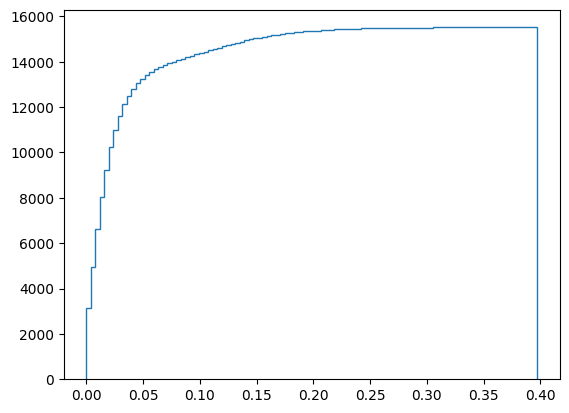

In [55]:
df = imsi_df.loc[imsi_df.dthr_cest==datetime.datetime(2024, 10, 28, 4, 0, 0)]
plt.hist(df.traffic_part, bins=100, histtype='step', cumulative=True, density=False)

(array([ 2961.,  4563.,  6050.,  7264.,  8275.,  9172.,  9796., 10359.,
        10825., 11196., 11455., 11676., 11869., 12011., 12138., 12230.,
        12335., 12424., 12502., 12575., 12652., 12721., 12779., 12854.,
        12909., 12964., 13014., 13084., 13140., 13207., 13266., 13334.,
        13401., 13459., 13510., 13568., 13619., 13671., 13708., 13748.,
        13786., 13822., 13857., 13894., 13922., 13955., 13978., 13999.,
        14026., 14049., 14069., 14084., 14095., 14109., 14118., 14125.,
        14136., 14148., 14155., 14160., 14172., 14179., 14187., 14191.,
        14200., 14203., 14209., 14212., 14216., 14219., 14220., 14223.,
        14225., 14226., 14231., 14232., 14235., 14238., 14239., 14239.,
        14239., 14239., 14239., 14240., 14242., 14242., 14245., 14245.,
        14247., 14247., 14247., 14247., 14247., 14247., 14247., 14247.,
        14247., 14247., 14247., 14248.]),
 array([0.        , 0.00344969, 0.00689939, 0.01034908, 0.01379878,
        0.01724847, 0.0206

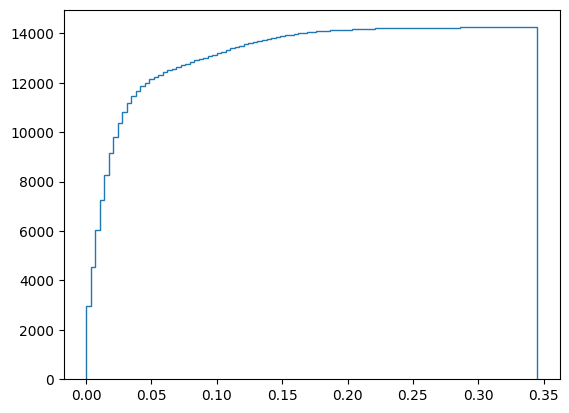

In [60]:
dt = [elem[2] for elem in data[0]]
plt.hist(dt, bins=100, histtype='step', cumulative=True, density=False)

### Stationary / transitive EnB

In [107]:
ho_df = pd.read_parquet('..\\Processed_data\\4G_CSV_ho_AGG_2024-10-28_coords.snappy.parquet', engine='fastparquet')
ho_df

,srcCell,dstCell,nb_imsi,nb_ho,srcLON,srcLAT,dstLON,dstLAT
0,A12_TRIANGLE_DE_ROCQUENCOURT,A12_TRIANGLE_DE_ROCQUENCOURT,23,23,2.093986,48.842075,2.093986,48.842075
1,A12_TRIANGLE_DE_ROCQUENCOURT,BEYNES_BIS,1,1,2.093986,48.842075,1.872747,48.845040
2,A12_TRIANGLE_DE_ROCQUENCOURT,BEYNES_D119,1,1,2.093986,48.842075,1.857706,48.859165
3,A12_TRIANGLE_DE_ROCQUENCOURT,BEYNES_TDB,1,1,2.093986,48.842075,1.900411,48.837810
4,A12_TRIANGLE_DE_ROCQUENCOURT,BOIS_D_ARCY_CROIX_BLANCHE,17,17,2.093986,48.842075,2.010703,48.797540
...,...,...,...,...,...,...,...,...
184932,ZENITH_INDOOR,PORTE_DES_LILAS,1,1,2.393206,48.894215,2.400011,48.885555
184933,ZENITH_INDOOR,QUATRE_CHEMINS,2,2,2.393206,48.894215,2.394108,48.909058
184934,ZENITH_INDOOR,RUE_DE_TOULOUSE,8,12,2.393206,48.894215,2.393536,48.883896
184935,ZENITH_INDOOR,STADE_LADOUMEGUE,13,21,2.393206,48.894215,2.393008,48.888416


Text(0, 0.5, '# Handovers')

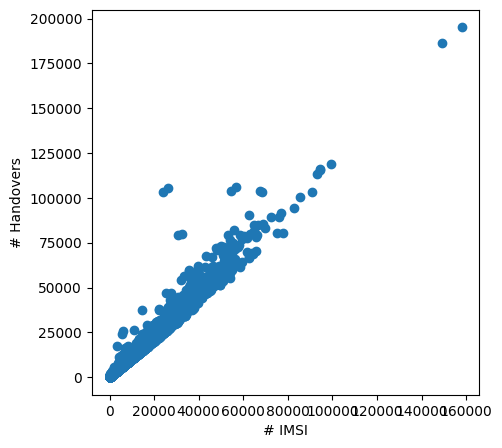

In [109]:
plt.figure(figsize=(5,5))
plt.scatter(ho_df.nb_imsi, ho_df.nb_ho)
plt.xlabel('# IMSI')
plt.ylabel('# Handovers')

Text(0.5, 1.0, 'Handover-IMSI difference')

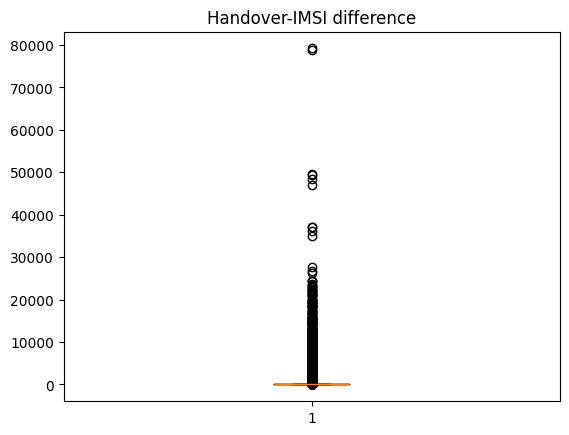

In [112]:
ser = ho_df.nb_ho - ho_df.nb_imsi
ser.max()
plt.boxplot(ser)
plt.title('Handover-IMSI difference')

In [139]:
q3 = int(ser.quantile(0.75))
transitive_df = ho_df.loc[(ho_df.nb_ho - ho_df.nb_imsi) < 1]
transitive_df = transitive_df.sort_values(by='nb_ho', ascending=False)
transitive_df

,srcCell,dstCell,nb_imsi,nb_ho,srcLON,srcLAT,dstLON,dstLAT
143072,ROME,ROME_METRO_L2,8350,8350,2.320547,48.884170,2.320903,48.882397
127869,PERI_DAUPHINE,PORTE_DE_LA_MUETTE,6645,6645,2.269617,48.867935,2.267242,48.860744
160280,ST_DENIS_SDF_NO_3,ST_DENIS_SDF_SO_2,6074,6074,2.358447,48.925247,2.358667,48.923540
165434,SURDENS_A86_PONT_COLBERT,ROUTE_SAINT_MARTIN_A86,5850,5850,2.152883,48.786293,2.124681,48.788100
135090,PORTE_DE_LA_MUETTE,PERI_DAUPHINE,5138,5138,2.267242,48.860744,2.269617,48.867935
...,...,...,...,...,...,...,...,...
184913,ZAC_DES_LILAS,SARCELLES_JOLIOT_CURIE,1,1,2.408325,48.877020,2.391986,48.978527
184860,ZAC_DES_LILAS,BONDY_GALLIENI_BIS,1,1,2.408325,48.877020,2.485106,48.905630
184861,ZAC_DES_LILAS,BONDY_SUD,1,1,2.408325,48.877020,2.462728,48.897495
184864,ZAC_DES_LILAS,CHOISY_LES_GONDOLES,1,1,2.408325,48.877020,2.420856,48.763940


In [ ]:
PATH_TIME = get_filename(DATE, folder='CSV_ho')
time_df = pd.read_csv(PATH_TIME)
time_df

,prev_eci_4g,eci_4g,ts_utc,nb_imsi,nb_ho,dthr_cest
0,24450049.0,26072590,1730134800,10,10,2024-10-28 18:00:00
1,24549398.0,23996936,1730138400,43,57,2024-10-28 19:00:00
2,25038593.0,25700869,1730138400,380,386,2024-10-28 19:00:00
3,25604877.0,25428998,1730134800,13,13,2024-10-28 18:00:00
4,24067336.0,24091144,1730131200,385,398,2024-10-28 17:00:00
...,...,...,...,...,...,...
17037367,25951756.0,24085766,1730142000,1,1,2024-10-28 20:00:00
17037368,24968968.0,24517641,1730142000,1,1,2024-10-28 20:00:00
17037369,24745729.0,24269320,1730091600,1,1,2024-10-28 06:00:00
17037370,24522755.0,25898498,1730127600,1,1,2024-10-28 16:00:00


In [120]:
# Join src/dst cell names
time_df = time_df.join(cells_df[['eci_4g','Cell']].set_index('eci_4g'), on='prev_eci_4g')
time_df.rename(columns={'Cell':'srcCell'}, inplace=True)
time_df = time_df.dropna(ignore_index=True)

time_df = time_df.join(cells_df[['eci_4g','Cell']].set_index('eci_4g'), on='eci_4g')
time_df.rename(columns={'Cell':'dstCell'}, inplace=True)
time_df = time_df.dropna(ignore_index=True)

time_df

,prev_eci_4g,eci_4g,ts_utc,nb_imsi,nb_ho,dthr_cest,srcCell,dstCell
0,24450049.0,26072590,1730134800,10,10,2024-10-28 18:00:00,VILLECRESNES,VILLECRESNES
1,24549398.0,23996936,1730138400,43,57,2024-10-28 19:00:00,PLAINE_DE_VAUGIRARD_BIS,HOPITAL_CELTON
2,25038593.0,25700869,1730138400,380,386,2024-10-28 19:00:00,EGLISE_D_AUTEUIL_METRO_L10,BTSH_MURAT_16_IND
3,25604877.0,25428998,1730134800,13,13,2024-10-28 18:00:00,MOLITOR_EU,RAYNOUARD_BRUNEAU
4,24067336.0,24091144,1730131200,385,398,2024-10-28 17:00:00,PORTE_DAUPHINE,TERNES_CPE_NEUILLY
...,...,...,...,...,...,...,...,...
16023816,25951756.0,24085766,1730142000,1,1,2024-10-28 20:00:00,RUE_ST_MAUR,SQUARE_VARLIN
16023817,24968968.0,24517641,1730142000,1,1,2024-10-28 20:00:00,MANTES_LA_JOLIE_MARTRAITS_UMTS,MANTES_BUCHELAY
16023818,24745729.0,24269320,1730091600,1,1,2024-10-28 06:00:00,TPEM_A86_THIAIS_FFF,THIAIS_RESISTANCE_BIS
16023819,24522755.0,25898498,1730127600,1,1,2024-10-28 16:00:00,VILLETTE,MANTES_DES_BATES


In [121]:
# Group by cell name (antennas located at the same point) and time
time_df = time_df.groupby(['srcCell','dstCell', 'dthr_cest'])[['nb_imsi','nb_ho']].sum()
time_df = time_df.reset_index()
time_df 

,srcCell,dstCell,dthr_cest,nb_imsi,nb_ho
0,A12_TRIANGLE_DE_ROCQUENCOURT,A12_TRIANGLE_DE_ROCQUENCOURT,2024-10-28 00:00:00,1,1
1,A12_TRIANGLE_DE_ROCQUENCOURT,A12_TRIANGLE_DE_ROCQUENCOURT,2024-10-28 01:00:00,1,1
2,A12_TRIANGLE_DE_ROCQUENCOURT,A12_TRIANGLE_DE_ROCQUENCOURT,2024-10-28 02:00:00,1,1
3,A12_TRIANGLE_DE_ROCQUENCOURT,A12_TRIANGLE_DE_ROCQUENCOURT,2024-10-28 03:00:00,2,2
4,A12_TRIANGLE_DE_ROCQUENCOURT,A12_TRIANGLE_DE_ROCQUENCOURT,2024-10-28 04:00:00,4,4
...,...,...,...,...,...
2078875,ZENITH_INDOOR,STALINGRAD,2024-10-28 02:00:00,10,10
2078876,ZENITH_INDOOR,STALINGRAD,2024-10-28 03:00:00,6,6
2078877,ZENITH_INDOOR,STALINGRAD,2024-10-28 04:00:00,18,21
2078878,ZENITH_INDOOR,STALINGRAD,2024-10-28 05:00:00,30,32


In [146]:
agg_df = time_df.groupby(['dstCell'])[['nb_imsi','nb_ho']].sum()
agg_df = agg_df.reset_index()
agg_df.sort_values(by='nb_ho', ascending=False, inplace=True)
agg_df

,dstCell,nb_imsi,nb_ho
2935,QUAI_MARCEL_BOYER,431116,493882
1416,IVRY_VICTOR_HUGO,289829,339505
1972,MITRY_MORY_CENTRE,253073,317475
1292,GOUSSAINVILLE,255021,310402
3012,ROISSY_ZONE_TECHNIQUE_BIS,238082,278760
...,...,...,...
2271,ORANGE_DEUIL_LA_BARRE_IND,8,8
2268,ORANGE_ARGENTEUIL_IND,6,6
2390,OSM_CHANEL_FAUBOURG_HONOR,0,0
2926,PYRENEES,0,0


In [149]:
ser = agg_df.nb_ho - agg_df.nb_imsi
thresh = ser.quantile(0.75)
agg_df.loc[agg_df.nb_ho - agg_df.nb_imsi < 10]

,dstCell,nb_imsi,nb_ho
1804,MAIRIE_DE_CLICHY_METRO_L13,7703,7712
1806,MAIRIE_DE_MONTROUGE_METRO_L4,7357,7363
443,BTSH_LHAY_LES_ROSES_03_IND,4956,4958
1028,EGLISE_D_AUTEUIL_METRO_L10,4118,4122
3546,TPIM_CEVENNES_CITROEN,3638,3643
...,...,...,...
2271,ORANGE_DEUIL_LA_BARRE_IND,8,8
2268,ORANGE_ARGENTEUIL_IND,6,6
2390,OSM_CHANEL_FAUBOURG_HONOR,0,0
2926,PYRENEES,0,0


C:\Users\arcti\AppData\Local\Temp\ipykernel_17756\3455981718.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  transcell_df.sort_values(by='dthr_cest', inplace=True)
C:\Users\arcti\AppData\Local\Temp\ipykernel_17756\3455981718.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  transcell_df.sort_values(by='dthr_cest', inplace=True)
C:\Users\arcti\AppData\Local\Temp\ipykernel_17756\3455981718.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus

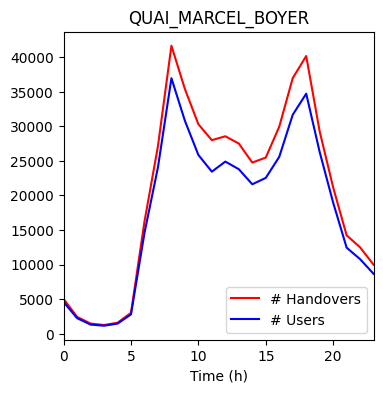

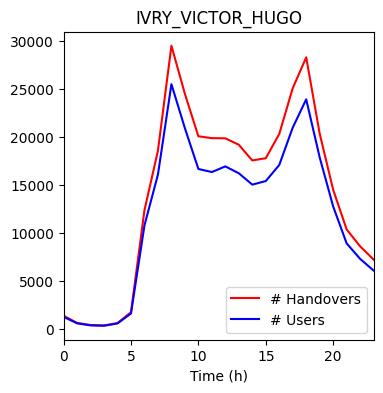

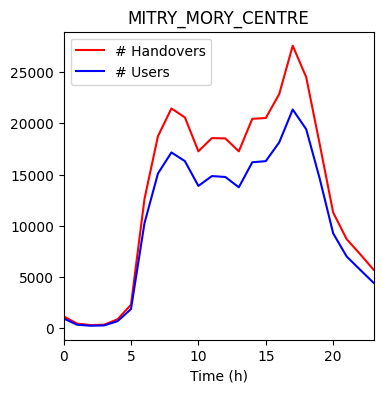

In [154]:
cells_transitive = ['QUAI_MARCEL_BOYER', 'IVRY_VICTOR_HUGO', 'MITRY_MORY_CENTRE']
cells_stationary = ['MAIRIE_DE_CLICHY_METRO_L13', 'MAIRIE_DE_MONTROUGE_METRO_L4', 'EGLISE_D_AUTEUIL_METRO_L10']

for c in cells_transitive:
    transcell_df = time_df.loc[time_df.dstCell==c]
    transcell_df.sort_values(by='dthr_cest', inplace=True)
    transcell_df = transcell_df.groupby('dthr_cest')[['nb_imsi','nb_ho']].sum()
    transcell_df = transcell_df.reset_index()
    #if len(transcell_df.nb_imsi)==24:
    plt.figure(figsize=(4,4))
    idx = np.arange(0,24,1)
    plt.plot(transcell_df.nb_ho, c='red', label='# Handovers')
    plt.plot(transcell_df.nb_imsi, c='blue', label='# Users')
    plt.xlabel('Time (h)')
    plt.xlim(0,23)
    plt.legend()
    plt.title(c)

In [142]:
transcell_df = time_df.loc[time_df.dstCell=='PORTE_DE_LA_MUETTE']
transcell_df.sort_values(by='dthr_cest', inplace=True)
transcell_df = transcell_df.groupby('dthr_cest')[['nb_imsi','nb_ho']].sum()
transcell_df = transcell_df.reset_index()
transcell_df

C:\Users\arcti\AppData\Local\Temp\ipykernel_17756\658907849.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  transcell_df.sort_values(by='dthr_cest', inplace=True)


,dthr_cest,nb_imsi,nb_ho
0,2024-10-28 00:00:00,964,1048
1,2024-10-28 01:00:00,571,611
2,2024-10-28 02:00:00,325,361
3,2024-10-28 03:00:00,306,345
4,2024-10-28 04:00:00,394,426
5,2024-10-28 05:00:00,778,803
6,2024-10-28 06:00:00,2765,2920
7,2024-10-28 07:00:00,5285,5612
8,2024-10-28 08:00:00,7222,7704
9,2024-10-28 09:00:00,6676,7235


In [144]:
transcell_df.nb_imsi.sum()

np.int64(98803)